<h1 class="center">Image Manipulation Ditection</h1>
![Image Manipulation Ditection
](https://belkasoft.com/images/forgery/kitten.png)

In [0]:
!pip install wget  > /dev/null && echo "wget was successfully installed!"
!pip install Pillow  > /dev/null && echo "pillow was successfully installed!"

wget was successfully installed!
pillow was successfully installed!


In [0]:
import wget
url = 'http://ifc.recod.ic.unicamp.br/fc.website/ifc-public-datasets/phase-01-training.tar.gz'
try:  
  filename = wget.download(url)
  print("successfully downloaded the data")
except:
  print("URL is not available")

successfully downloaded the data


In [0]:
import tarfile
tar = tarfile.open("phase-01-training.tar.gz")
tar.extractall()
tar.close()

In [0]:
#image augmentation for image and mask
!pip install -U git+https://github.com/albu/albumentations > /dev/null && echo "All libraries are successfully installed!"

All libraries are successfully installed!


In [0]:
from albumentations import (
    PadIfNeeded,
    HorizontalFlip,
    VerticalFlip,    
    CenterCrop,    
    Crop,
    Compose,
    Transpose,
    RandomRotate90,
    ElasticTransform,
    GridDistortion, 
    OpticalDistortion,
    RandomSizedCrop,
    OneOf,
    CLAHE,
    RandomBrightnessContrast,    
    RandomGamma    
)
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")
import cv2
import shutil

In [0]:
import matplotlib.pyplot as plt
import PIL
import numpy as np
import pandas as pd
import os
import tarfile
from PIL import Image
import matplotlib
from skimage.io import imread
from skimage import exposure, color
from skimage.transform import resize
import keras
from keras import backend as K
from keras.datasets import cifar10
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
from keras.layers.merge import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam,SGD
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img

Using TensorFlow backend.


In [0]:
pristine_dir='./dataset-dist/phase-01/training/pristine'
len(os.listdir(pristine_dir))

1050

In [0]:

Edites_dir='./dataset-dist/phase-01/training/fake'
len(os.listdir(Edites_dir))

901

In [0]:
fake_images=list(os.listdir(Edites_dir))
fake_image_ids=list(set([val[:32] for val in fake_images]))
len(fake_image_ids)

451

<h2>Plotting Mask for Edited Images and GerratingMask for Prestine Images</h2>

In [0]:
pristine_imageIDs=[]
for file in os.listdir(pristine_dir):
  pristine_imageIDs.append(file)
pristine_imageIDs=[val[0:32] for val in pristine_imageIDs]
dirty_imageIDs=[]
for file in os.listdir(Edites_dir):
  dirty_imageIDs.append(file)
dirty_imageIDs=list(set([val[0:32] for val in dirty_imageIDs]))


In [0]:
dirty_imageIDs.remove('.DS_Store')
len(dirty_imageIDs)

450

450 Edited Images and 1050 clean images in different sizes are given as raw data

Given images are placed in a way that if acorresponding image has a mask then it has the same id but ends with .mask.png Extension, Here we will plot image and it's mask if there is no mask then image is not manipulated so we generate a mask with the size of image

In [0]:

def plot_Mask(image_id,fake=True):
  if fake:
    PATH='./dataset-dist/phase-01/training/fake/'+image_id+'.png'
  else:
    PATH='./dataset-dist/phase-01/training/pristine/'+image_id+'.png'
    

  PATH_mask=PATH[:-3]+'mask.png'
  img = Image.open(PATH).convert("RGB")
  try:
    mask_img=Image.open(PATH_mask).convert("RGB")
  except:
    mask_img=Gen_mask_prestine(PATH)
  fig = plt.figure(figsize=(15,10))
  ax1 = fig.add_subplot(221)
  ax2 = fig.add_subplot(222)
  ax1.set_title("Image")
  ax2.set_title("Mask")
  ax1.imshow(img)
  ax2.imshow(mask_img)
  print("image {0} has a shape of {1}".format(image_id,np.array(img).shape))
  print("image {0} has a shape of {1}".format(image_id,np.array(mask_img).shape))
  print("="*60)

In [0]:
def Gen_mask_prestine(path):
  img = Image.open(path).convert("RGB")
  im_shape=(np.array(img)).shape
  return np.ones((im_shape))*255

image b0e304ca50739b4bb48620960a4006b9 has a shape of (768, 1024, 3)
image b0e304ca50739b4bb48620960a4006b9 has a shape of (768, 1024, 3)


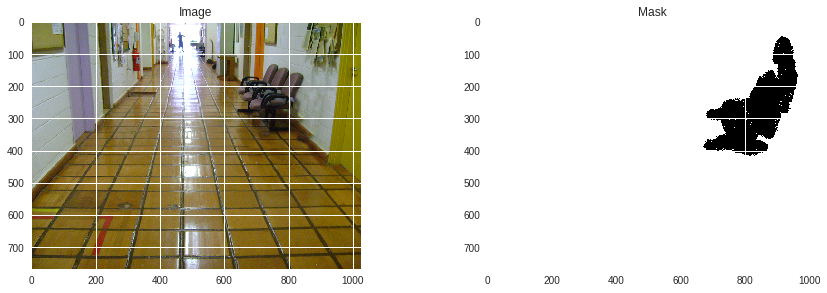

In [0]:
plot_Mask(dirty_imageIDs[362])

Grey Scale


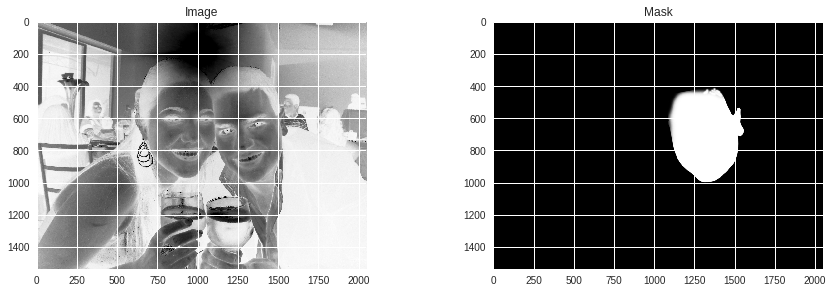

In [0]:
  fig = plt.figure(figsize=(15,10))
  ax1 = fig.add_subplot(221)
  ax2 = fig.add_subplot(222)
  ax1.set_title("Image")
  ax2.set_title("Mask")
  ax1.imshow((np.array(img))[:,:,1])
  ax2.imshow((np.array(mask_img))[:,:,1])
  print("Grey Scale")
  print("="*60)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


image 7afcfe686667df48e62e685663460846 has a shape of (768, 1024, 3)


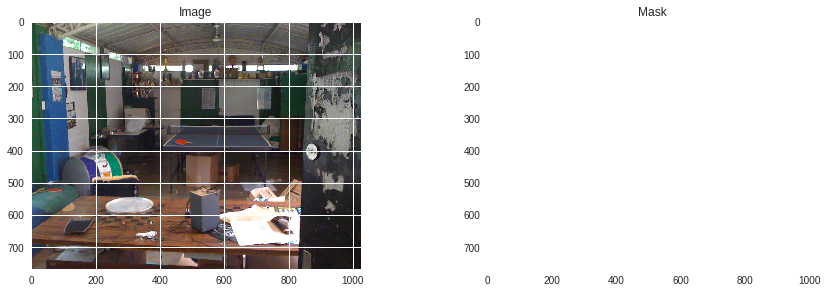

In [0]:
plot_Mask(pristine_imageIDs[0],False)

<h1>Image Augmentation</h1>

the data is way small so complex models cannot learn correlation between the pixels so we perform various  Image Augmentation, but we have to perfom same image augmentation for image and mask we do operations like

 PadIfNeeded,
    HorizontalFlip,
    VerticalFlip,    
    CenterCrop,    
    Crop,
    Compose,
    Transpose,
    RandomRotate90,
    ElasticTransform,
    GridDistortion, 
    OpticalDistortion,
    RandomSizedCrop,
    OneOf,
    CLAHE,
    RandomBrightnessContrast,    
    RandomGamma    
I hve tried all of the above and picked some best ones for mask augmentation

===> But Before augmentation we resize images and convert them to proper RGB format, We tipically resize mask and image to 512, 512 this size of image is a bit computationally intensive so i tried with 128*128, 256*256 But results are not good, so we take small batch size and less no of steps per epoch

In [0]:
%%time
if not os.path.exists("fake_data"):
    os.makedirs("fake_data/masks")
    os.makedirs("fake_data/images")
for i,val in tqdm(enumerate(dirty_imageIDs)):
  actual_image="./dataset-dist/phase-01/training/fake/"+val+".png"
  img=Image.open(actual_image).convert("RGB")
  image_id="image{}.png".format(i)
  baseheight = 512
  
  wsize = 512
  img = img.resize((wsize, baseheight), PIL.Image.ANTIALIAS)
  img.save("fake_data/images/"+image_id)
  mask_image="./dataset-dist/phase-01/training/fake/"+val+".mask.png"
  mask=Image.open(mask_image).convert("RGB")
  hpercent = (baseheight / float(mask.size[1]))
  wsize = int((float(mask.size[0]) * float(hpercent)))
  mask = mask.resize((wsize, baseheight), PIL.Image.ANTIALIAS)
  mask_id="mask{}.png".format(i)
  mask.save("fake_data/masks/"+mask_id)
print("Done Resizing for dirty images and masks")  

450it [02:40,  2.03it/s]

Done Resizing for dirty images and masks
CPU times: user 2min 37s, sys: 3.12 s, total: 2min 40s
Wall time: 2min 40s


In [0]:
%%time
for i,val in enumerate(pristine_imageIDs):
  actual_image="./dataset-dist/phase-01/training/pristine/"+val+".png"
  img=Image.open(actual_image).convert("RGB")
  image_id="image{}.png".format(450+i)
  baseheight = 512
  wsize = 512
  img = img.resize((wsize, baseheight), PIL.Image.ANTIALIAS)
  img.save("fake_data/images/"+image_id)
  
print("Done Resizing for pristine") 

Done Resizing for pristine
CPU times: user 2min 56s, sys: 1.08 s, total: 2min 57s
Wall time: 2min 57s


In [0]:
image=cv2.imread('./fake_data/images/image5.png')
mask=cv2.imread('./fake_data/masks/mask5.png')

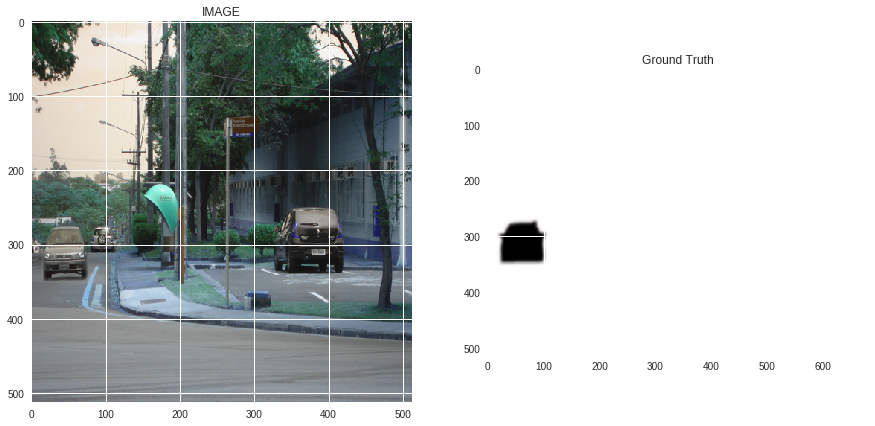

In [0]:
#plt.imshow(image)
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
ax[0].imshow(image)
ax[0].set_title('IMAGE')
ax[1].imshow(mask)
ax[1].set_title('Ground Truth');

\

<h2>Basic Image Augmentation</h2>

In [0]:
def show_img(img, figsize=(8, 8)):
    fig, ax = plt.subplots(figsize=figsize)
    ax.grid(False)
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.imshow(img)
    plt.imshow(img)

In [0]:
def augment_and_show(aug, image):
    image = aug(image=image)['image']
    #plt.figure(figsize=(10, 5))
    #plt.imshow(image)
    return image

In [0]:
def augment(augment_type):
  aug =augment_type
  img=augment_and_show(aug, image)
  msk=augment_and_show(aug, mask)
  fig, ax = plt.subplots(1, 2, figsize=(15, 10))

  ax[0].imshow(img)

  ax[0].set_title('IMAGE')

  ax[1].imshow(msk)
  ax[1].set_title('Ground Truth');

In [0]:
import albumentations as a

<h2>Advanced Image Augmentation</h2>

In [0]:
def visualize(image, mask, original_image=None, original_mask=None):
    fontsize = 18    
    if original_image is None and original_mask is None:
        f, ax = plt.subplots(2, 1, figsize=(8, 8))
        ax[0].imshow(image)
        ax[1].imshow(mask)
    else:
        f, ax = plt.subplots(2, 2, figsize=(8, 8))
        ax[0, 0].imshow(original_image)
        ax[0, 0].set_title('Original image', fontsize=fontsize)        
        ax[1, 0].imshow(original_mask)
        ax[1, 0].set_title('Original mask', fontsize=fontsize)        
        ax[0, 1].imshow(image)
        ax[0, 1].set_title('Transformed image', fontsize=fontsize)        
        ax[1, 1].imshow(mask)
        ax[1, 1].set_title('Transformed mask', fontsize=fontsize)

In [0]:
original_height, original_width = image.shape[:2]

<h1>Padding</h1>

UNet type architecture require input image size be divisible by $2^N$, where $N$ is th enumber of the maxpooling layers. In the vanilla UNet $N=5$  $\Longrightarrow$ we need to pad input images to the closest divisible by $2^5 = 32$ number which is 128. This operation may be performed using PadIfNeeded transformation. Which pads both image and mask on all four sides. Padding type (zero, constant, reflection) may be specified. Default padding is reflection padding.

(512, 512, 3) (512, 682, 3)


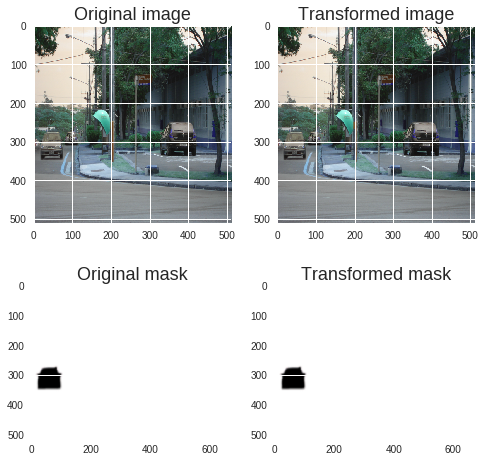

In [0]:
aug = PadIfNeeded(p=1, min_height=512, min_width=512)
augmented = aug(image=image, mask=mask)
image_padded = augmented['image']
mask_padded = augmented['mask']
print(image_padded.shape, mask_padded.shape)
visualize(image_padded, mask_padded, original_image=image, original_mask=mask)

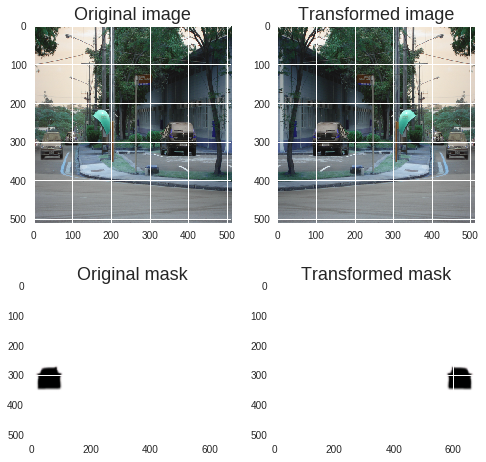

In [0]:
aug = HorizontalFlip(p=1)
augmented = aug(image=image, mask=mask)
image_h_flipped = augmented['image']
mask_h_flipped = augmented['mask']
visualize(image_h_flipped, mask_h_flipped, original_image=image, original_mask=mask)

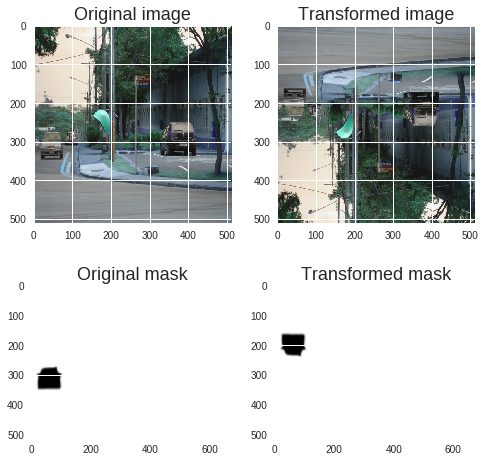

In [0]:
aug = VerticalFlip(p=1)
augmented = aug(image=image, mask=mask)
image_v_flipped = augmented['image']
mask_v_flipped = augmented['mask']
visualize(image_v_flipped, mask_v_flipped, original_image=image, original_mask=mask)

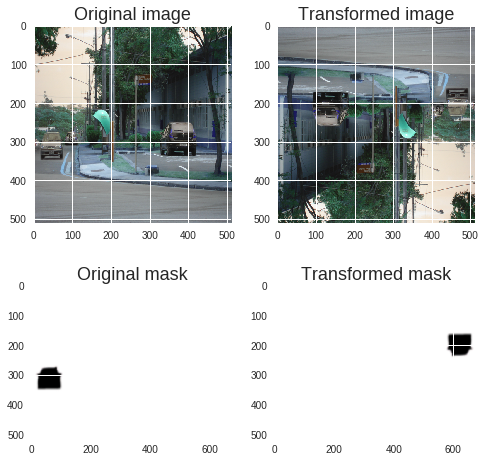

In [0]:
aug = RandomRotate90(p=1)
augmented = aug(image=image, mask=mask)
image_rot90 = augmented['image']
mask_rot90 = augmented['mask']
visualize(image_rot90, mask_rot90, original_image=image, original_mask=mask)

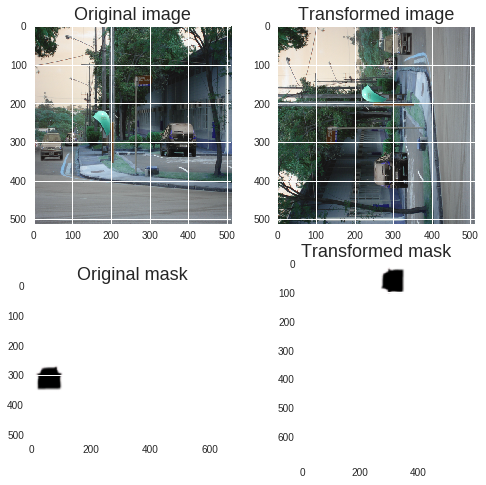

In [0]:
aug = Transpose(p=1)
augmented = aug(image=image, mask=mask)
image_transposed = augmented['image']
mask_transposed = augmented['mask']
visualize(image_transposed, mask_transposed, original_image=image, original_mask=mask)

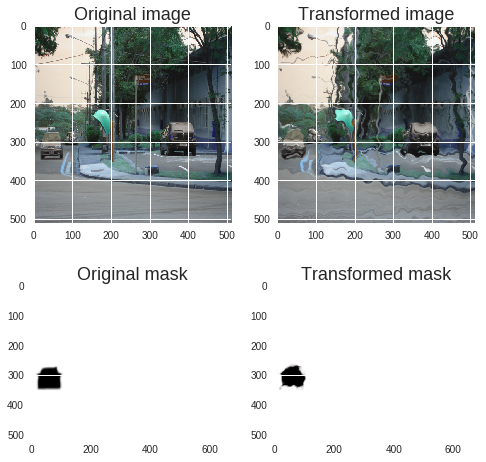

In [0]:
aug = ElasticTransform(p=1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03)
augmented = aug(image=image, mask=mask)
image_elastic = augmented['image']
mask_elastic = augmented['mask']
visualize(image_elastic, mask_elastic, original_image=image, original_mask=mask)

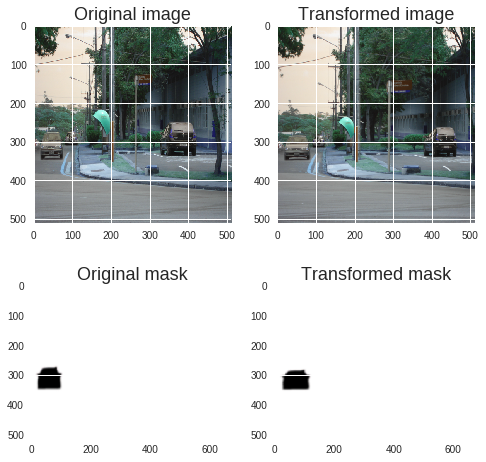

In [0]:
aug = GridDistortion(p=1)
augmented = aug(image=image, mask=mask)
image_grid = augmented['image']
mask_grid = augmented['mask']
visualize(image_grid, mask_grid, original_image=image, original_mask=mask)

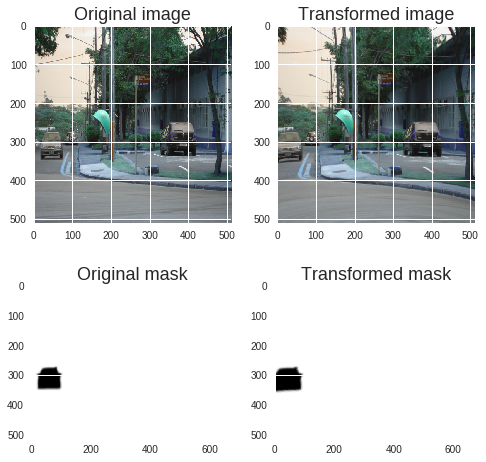

In [0]:
aug = OpticalDistortion(p=1, distort_limit=2, shift_limit=0.5)
augmented = aug(image=image, mask=mask)
image_optical = augmented['image']
mask_optical = augmented['mask']
visualize(image_optical, mask_optical, original_image=image, original_mask=mask)

In [0]:
# a bunch of functions for image augmentation
def horizontalFlip(image,mask):
  aug = HorizontalFlip(p=1)

  augmented = aug(image=image, mask=mask)

  image_h_flipped = augmented['image']
  mask_h_flipped = augmented['mask']
  return image_h_flipped,mask_h_flipped

def verticalFlip(image,mask):
  
  aug = VerticalFlip(p=1)

  augmented = aug(image=image, mask=mask)

  image_v_flipped = augmented['image']
  mask_v_flipped = augmented['mask']
  return image_v_flipped,mask_v_flipped

def randomRotate(image,mask):
  aug = RandomRotate90(p=1)
  augmented = aug(image=image, mask=mask)
  image_rot90 = augmented['image']
  mask_rot90 = augmented['mask']  
  return image_rot90,mask_rot90

def transpose(image,mask):
  aug = Transpose(p=1)

  augmented = aug(image=image, mask=mask)

  image_transposed = augmented['image']
  mask_transposed = augmented['mask']
  return image_transposed,mask_transposed

def elasticDistortion(image,mask):
  aug = ElasticTransform(p=1, alpha=120, sigma=120 * 0.05, alpha_affine=120 * 0.03)

  augmented = aug(image=image, mask=mask)

  image_elastic = augmented['image']
  mask_elastic = augmented['mask']

  return image_elastic,mask_elastic

def opticalDistortion(image,mask):
  aug = OpticalDistortion(p=1, distort_limit=2, shift_limit=0.5)

  augmented = aug(image=image, mask=mask)

  image_optical = augmented['image']
  mask_optical = augmented['mask']

  return image_optical,mask_optical

In [0]:
%%time
if not os.path.isfile('./augmented_data'):
  os.makedirs('./augmented_data/images')
  os.makedirs('./augmented_data/masks')
w=0
for i in range(len(os.listdir('./fake_data/images'))):
  if i<450:

    image=cv2.imread('./fake_data/images/image{}.png'.format(i))
    mask=cv2.imread('./fake_data/masks/mask{}.png'.format(i))
    
    actual_image=image.copy()
    actual_mask=mask.copy()
    img_o=Image.fromarray(actual_image)
    mskh_o=Image.fromarray(actual_mask)
    img_o.save('./augmented_data/images/image{}.png'.format(w))
    mskh_o.save('./augmented_data/masks/mask{}.png'.format(w))
    
   
    h=horizontalFlip(image,mask)
    imgh=Image.fromarray(h[0])
    mskh=Image.fromarray(h[1])
    imgh.save('./augmented_data/images/image{}.png'.format(w+1))
    mskh.save('./augmented_data/masks/mask{}.png'.format(w+1))

    v=verticalFlip(image,mask)
    imgv=Image.fromarray(v[0])
    mskv=Image.fromarray(v[1])
    imgv.save('./augmented_data/images/image{}.png'.format(w+2))
    mskv.save('./augmented_data/masks/mask{}.png'.format(w+2))

    t=transpose(image,mask)
    imgt=Image.fromarray(t[0])
    mskt=Image.fromarray(t[1])
    imgt.save('./augmented_data/images/image{}.png'.format(w+3))
    mskt.save('./augmented_data/masks/mask{}.png'.format(w+3))

    r=randomRotate(image,mask)
    imgr=Image.fromarray(r[0])
    mskr=im=Image.fromarray(r[1])
    imgr.save('./augmented_data/images/image{}.png'.format(w+4))
    mskr.save('./augmented_data/masks/mask{}.png'.format(w+4))

    o=opticalDistortion(image,mask)
    imgo=Image.fromarray(o[0])
    msko=Image.fromarray(o[1])
    imgo.save('./augmented_data/images/image{}.png'.format(w+5))
    msko.save('./augmented_data/masks/mask{}.png'.format(w+5))

    e=elasticDistortion(image,mask)
    imge=Image.fromarray(e[0])
    mske=Image.fromarray(e[1])
    imge.save('./augmented_data/images/image{}.png'.format(w+6))
    mske.save('./augmented_data/masks/mask{}.png'.format(w+6))
    
    w=w+7
    
  else:
    print("DONE Augmenting !")
    break
    
  
  

DONE Augmenting !
CPU times: user 8min 26s, sys: 5.38 s, total: 8min 31s
Wall time: 8min 24s


In [0]:
%%time
#moving pristine images to the augmented directory and giving a default mask
img=Image.open('./white_.png')
img=img.resize((512, 512), PIL.Image.ANTIALIAS)
#plt.imshow(img)
img.save('./defaultmask.png')
w=3150
for i in range(1050):

    image=cv2.imread('./fake_data/images/image{}.png'.format(i+450))

    
    mask=cv2.imread('./defaultmask.png')

    img_o=Image.fromarray(image)
    mskh_o=Image.fromarray(mask)
    img_o.save('./augmented_data/images/image{}.png'.format(w))
    mskh_o.save('./augmented_data/masks/mask{}.png'.format(w))
    w=w+1
print("Done!")

Done!
CPU times: user 2min 29s, sys: 1.11 s, total: 2min 30s
Wall time: 2min 30s


In [0]:
len(os.listdir('./augmented_data/masks'))

4200

Now We have 4200 saples thats not a lot, but good enough to experiment
Feeding the raw image  to the Nueral Net and asking it to predict the mask was very much naive, i have tried it but the results are worse, infact every manipulated image leaves some noice statstics when it is subjected to some operations so there are ways to capture that Noice, Like 

Error Level Analysis

Noise Analysis

Level Sweep

Luminance Gradient

Principal Component Analysis

Meta Data - We can extract some Features from image metadata and can add to the deepest layers or to the falttened array

SRM Filter

<h2>Image Meta Data</h2>
SubfileType	1
ImageDescription	
Make	SONY
Model	ILCE-6000
Orientation	1
XResolution	300
YResolution	300
ResolutionUnit	2
Software	darktable 1.6.6
ModifyDate	2015:08:14 13:32:39
YCbCrPositioning	2
Rating	1
RatingPercent	20
DateTimeOriginal	Thu Jul 31 2014 21:35:43 GMT+0530 (India Standard Time)
GPSVersionID	2,2,0,0
GPSLatitudeRef	N
GPSLatitude	47.3500
GPSLongitudeRef	E
GPSLongitude	8.4980
ExposureTime	0.0050
FNumber	11
ExposureProgram	2
ISO	100
SensitivityType	2
RecommendedExposureIndex	100
CreateDate	Thu Jul 31 2014 21:35:43 GMT+0530 (India Standard Time)
CompressedBitsPerPixel	8
BrightnessValue	10.2047
ExposureCompensation	0
MaxApertureValue	4
MeteringMode	5
LightSource	0
Flash	16
FocalLength	17
ColorSpace	1
ExifImageWidth	1024
ExifImageHeight	576
CustomRendered	0
ExposureMode	0
WhiteBalance	0
DigitalZoomRatio	1
FocalLengthIn35mmFormat	25
SceneCaptureType	0
Contrast	0
Saturation	0
Sharpness	0
LensInfo	10,18,4,4
LensModel	E 10-18mm F4 OSS
InteropIndex	R98
HasThumbnail	true
ThumbnailWidth	256
ThumbnailHeight	144
ThumbnailType	image/jpeg


for this case study i have skipped meta data features 

A research paper by adobe says that they used SRM filter, so i tried basic SRM filter, but it did not scale up much fast it took  about 15 min/image(240*240) in python  implementation, and i experimented on a sample data but results are not much intresting

<h3>SRM Implementation</h3>

In [0]:
class UnionFind:

    def __init__(self):
        """Create a new empty union-find structure."""
        self.weights = {}
        self.parents = {}

    def __getitem__(self, object):
        """Find and return the name of the set containing the object."""

        # check for previously unknown object
        if object not in self.parents:
            self.parents[object] = object
            self.weights[object] = 1
            return object

        # find path of objects leading to the root
        path = [object]
        root = self.parents[object]
        while root != path[-1]:
            path.append(root)
            root = self.parents[root]

        # compress the path and return
        for ancestor in path:
            self.parents[ancestor] = root
        return root
        
    def __iter__(self):
        """Iterate through all items ever found or unioned by this structure."""
        return iter(self.parents)

    def union(self, *objects):
        """Find the sets containing the objects and merge them all."""
        roots = [self[x] for x in objects]
        heaviest = max([(self.weights[r],r) for r in roots])[1]
        for r in roots:
            if r != heaviest:
                self.weights[heaviest] += self.weights[r]
                self.parents[r] = heaviest
        return heaviest


In [0]:
import numpy

#from UnionFind import UnionFind

class SRM:
    def __init__(self, image, Q=32.0):
        self._height = image.shape[0]
        self._width = image.shape[1]
        if image.ndim == 3:
            self._depth = image.shape[2]
        else:
            self._depth = 1
        
        self._n = self._width * self._height
        n = self._n
        self._image = image.reshape(n, -1)
        
        self._logdelta = 2.0 * numpy.log(6.0 * n)
        self._smallregion = int(0.001 * n)
        self._q = Q
    
    def run(self):
        self.initialization()
        self.segmentation()
        return self.finalize()
    
    def initialization(self):
        print ("init")
        self._uf = UnionFind()
        uf = self._uf
        n = self._n
        height = self._height
        width = self._width
        depth = self._depth
        
        img = self._image
        self._data = numpy.empty([n, depth + 2])
        self._sizes = numpy.ones(n)
        
        for i in range(height):
            for j in range(width):
                idx = i * width + j
                uf[idx]
                self._data[idx, 0:depth] = img[idx]
                self._data[idx, depth ] = i
                self._data[idx, depth ] = j
    
    def segmentation(self):
        pairs = self.pairs()
        print ("segmentation")
        
        for (r1, r2) in pairs:
            r1 = self._uf[r1]
            r2 = self._uf[r2]
            
            if r1 != r2 and self.predicate(r1, r2):
                self.merge(r1, r2)
        
        self.merge_small_regions()
    
    def pairs(self):
        print ("pairs")
        pairs = []
        height = self._height
        width = self._width
        
        # using a C4-connectivity
        for i in range(height - 1):
            for j in range(width - 1):
                idx = i * width + j
                # left
                pairs.append( ( idx, i * width + j + 1) )
                
                # below
                pairs.append( ( idx, (i + 1) * width + j) )
        
        pairs = self.sort(pairs)
        return pairs
    
    def sort(self, pairs):
        print ("sort")
        img = self._image
        def diff(p):
            (r1, r2) = p
            diff = numpy.max(numpy.abs(img[r1] - img[r2]))
            return diff
        return sorted(pairs, key=diff)
    
    def predicate(self, r1, r2):
        g = 256.0
        logdelta = self._logdelta
        
        w = self._sizes
        out = self._data
        
        d2 = (out[r1] - out[r2])**2
        
        log_r1 = min(g, w[r1]) * numpy.log(1.0 + w[r1])
        log_r2 = min(g, w[r2]) * numpy.log(1.0 + w[r2])
        
        q = self._q
        dev1 = g**2 / (2.0 * q * w[r1]) * (log_r1 + logdelta)
        dev2 = g**2 / (2.0 * q * w[r2]) * (log_r2 + logdelta)
        dev = dev1 + dev2
        
        return (d2 < dev).all()
    
    def merge(self, r1, r2):
        r = self._uf.union(r1, r2)
        
        s1 = self._sizes[r1]
        s2 = self._sizes[r2]
        n = s1 + s2
        self._data[r] = (s1 * self._data[r1] \
            + s2 * self._data[r2]) / n
        self._sizes[r] = n
    
    def merge_small_regions(self):
        print ("small")
        
        height = self._height
        width = self._width
        smallregion = self._smallregion
        
        for i in range(self._height):
            for j in range(1, self._width):
                idx = i * width + j
                r1 = self._uf[idx]
                r2 = self._uf[idx - 1]
                
                if r1 != r2 and ( self._sizes[r1] < smallregion or self._sizes[r2] < smallregion):
                    self.merge(r1, r2)
    
    def finalize(self):
        print ("finalize")
        
        height = self._height
        width = self._width
        depth = self._depth
        
        uf = self._uf
        data = self._data[:, 0:depth]
        out = numpy.empty([self._n, depth])
        for i in range(height):
            for j in range(1, width):
                idx = i * width + j
                r1 = uf[idx]
                out[idx] = data[r1]
        
        self._finalized = out.reshape(height, width, -1)
        return self._finalized
    
    def map(self):
        print ("map")
        
        height = self._height
        width = self._width
        depth = self._depth
        
        classes = {}
        
        uf = self._uf
        data = self._data[:, 0:depth]
        out = numpy.empty(self._n)
        for i in range(height):
            for j in range(1, width):
                idx = i * width + j
                r1 = uf[idx]
                if r1 in classes:
                    classes[r1] += 1
                else:
                    classes[r1] = 1
                out[idx] = r1
        
        return classes, out.reshape(height, width)
    
    def exploded(self):
        print ("exploded")
        
        out0 = numpy.empty([n, depth])
        out = self._data
        expl = numpy.zeros([2 * self._height, 2 * self._width, self._depth])
        
        for i in range(self._height):
            for j in range(1, self._width):
                r1 = self._uf[r]
                x = int(self._more[r1, 0])
                y = int(self._more[r1, 1])
                expl[i + x, j + y] = out[r]
        
        return expl



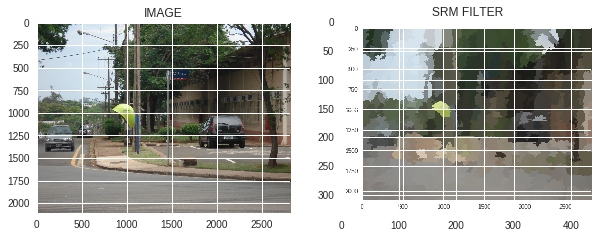

In [2]:
from PIL import Image
srmimg=Image.open('./srm.png')
img=Image.open('./srm original.png')
import matplotlib.pyplot as plt


q=32.0
im=np.array(img)

srm = SRM(im, q)
segmented = srm.run()
segmented=segmented/256
fig, ax = plt.subplots(1, 2, figsize=(10, 10))

ax[0].imshow(img)

ax[0].set_title('IMAGE')

ax[1].imshow(srmimg)
ax[1].set_title('SRM FILTER');

<h1>Error Level Analysis (ELA)</h1>

In a  composite image, where the different parts have different JPEG compression levels

The same image is subjected  to a uniform 90%-100% quality JPEG compression

The difference between the two images shows a variation of the JPEG compression artifacts



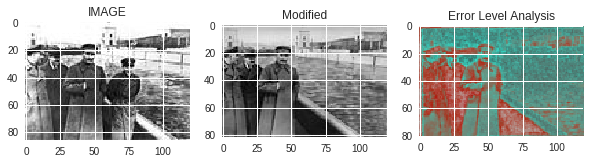

In [5]:
dimg=Image.open('./modified.jpg')
img=Image.open('./original.jpg')
ela=Image.open('./ela.png')

fig, ax = plt.subplots(1, 3, figsize=(10, 10))

ax[0].imshow(img)

ax[0].set_title('IMAGE')

ax[1].imshow(dimg)
ax[1].set_title('Modified');


ax[2].imshow(ela)
ax[2].set_title('Error Level Analysis');

I choose JPEG compression quality value as 95% and applied it to all the images

Plot for ELA subjected image and it's mask in the dataset

In [0]:
from PIL import Image, ImageChops

TEMP = 'temp.jpg'
SCALE = 21


def ELA(path):
    original = Image.open(path).convert("RGB")
    original.save(TEMP, quality=95)
    temporary = Image.open(TEMP)

    diff = ImageChops.difference(original, temporary)
    d = diff.load()
    WIDTH, HEIGHT = diff.size
    for x in range(WIDTH):
        for y in range(HEIGHT):
            d[x, y] = tuple(k * SCALE for k in d[x, y])

    return diff

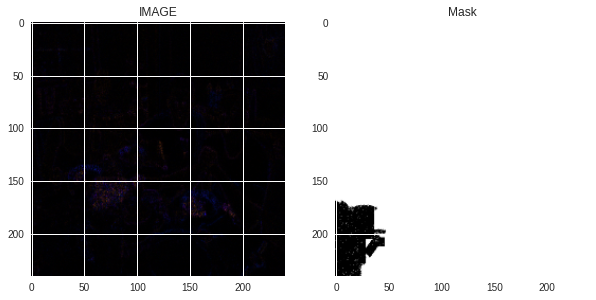

In [0]:
fig, ax = plt.subplots(1, 2, figsize=(10, 10))
ax[0].imshow(X[5], interpolation='bilinear', cmap='gray')
ax[0].set_title('IMAGE')
ax[1].imshow(y[5], interpolation='bilinear', cmap='gray')
ax[1].set_title('Mask');

In [0]:
%%time
if not os.path.exists("augmented_data/ela95"):
    os.makedirs("augmented_data/ela95")
    #os.makedirs("fake_data/images")
from PIL import Image, ImageChops, ImageEnhance
#os.makedirs("fake_data/ela95")
for file in (os.listdir('./augmented_data/images')):
  filename = "./augmented_data/images/{}".format(file)
  resaved = '.resaved.jpg'
  ela =  "./augmented_data/ela95/{}".format(file)

  im = Image.open(filename).convert("RGB")

  im.save(resaved, 'JPEG', quality=98)
  resaved_im = Image.open(resaved)

  ela_im = ImageChops.difference(im, resaved_im)
  extrema = ela_im.getextrema()
  max_diff = max([ex[1] for ex in extrema])
  scale = 255.0/max_diff

  ela_im = ImageEnhance.Brightness(ela_im).enhance(scale)

 
  ela_im.save(ela)
print("DONE Converting to ELA!")

DONE Converting to ELA!
CPU times: user 14min 36s, sys: 5.82 s, total: 14min 42s
Wall time: 14min 43s


In [0]:
#don't run unless your ram size is big, batch wise loading was used below can skip this
im_height=240
im_width=240

def get_data():
    ids=[x for x in range(1500)]
    X = np.zeros((len(ids), im_height, im_width, 3), dtype=np.float32)

    y = np.zeros((len(ids), 240, 240, 3), dtype=np.float32)

    for n, id_ in tqdm_notebook(enumerate(ids), total=len(ids)):

        img = load_img("./fake_data/ela100/image{}.png".format(id_))
        x_img = img_to_array(img)
        x_img = resize(x_img, (240, 240, 3), mode='constant', preserve_range=True)


        if  id_<450:
            mask = img_to_array(load_img("./fake_data/masks/mask{}.png".format(id_)))
            mask = resize(mask, (240, 240, 3), mode='constant', preserve_range=True)
        else:
            mask=np.ones(shape=(240,240,3))*255

        X[n] =  x_img / 255 

        y[n] = mask / 255
    print('Done!')

    return X, y

    
X, y = get_data()


Done!


In [0]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.15, random_state=0)

<h1>UNET architecture</h1>
![alt text](https://cdn-images-1.medium.com/max/1600/0*XopkzM3HLI4UEKSZ.png)

First we down sample the image by extracting the importent features and we reconstuct the image by upsampling 

Concat is just like skip connections, U-Net is a kind of Auto Encoder it compares each pixel between input and output and finally learns some pixelwise scemantics

<h2>U NET</h2>

In [0]:
def conv2d_block(input_dim, n_filters, kernel_size=3, batchnorm=True):

    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",padding="same")(input_dim)

    x = BatchNormalization()(x)
    x = Activation("relu")(x)

    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",padding="same")(x)

    x = BatchNormalization()(x)
    final_block = Activation("relu")(x)
    return final_block

In [0]:
input_img = Input((512, 512, 3), name='img')
n_filters=16
batchnorm=True
dropout=0.5

# contracting path
c1 = conv2d_block(input_img, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
p1 = MaxPooling2D((2, 2)) (c1)
p1 = Dropout(dropout*0.5)(p1)

c2 = conv2d_block(p1, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)
p2 = MaxPooling2D((2, 2)) (c2)
p2 = Dropout(dropout)(p2)

c3 = conv2d_block(p2, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)
p3 = MaxPooling2D((2, 2)) (c3)
p3 = Dropout(dropout)(p3)

c4 = conv2d_block(p3, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
p4 = Dropout(dropout)(p4)
    
c5 = conv2d_block(p4, n_filters=n_filters*16, kernel_size=3, batchnorm=batchnorm)
    
#Expanding path
u6 = Conv2DTranspose(n_filters*8, (3, 3), strides=(2, 2), padding='same') (c5)
#skip_connections
u6 = concatenate([u6, c4])
u6 = Dropout(dropout)(u6)
c6 = conv2d_block(u6, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)

u7 = Conv2DTranspose(n_filters*4, (3, 3), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
u7 = Dropout(dropout)(u7)
c7 = conv2d_block(u7, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)

u8 = Conv2DTranspose(n_filters*2, (3, 3), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
u8 = Dropout(dropout)(u8)
c8 = conv2d_block(u8, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)

u9 = Conv2DTranspose(n_filters*1, (3, 3), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
u9 = Dropout(dropout)(u9)
c9 = conv2d_block(u9, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    
outputs = Conv2D(3, (1, 1), activation='sigmoid') (c9)
model = Model(inputs=[input_img], outputs=[outputs])


In [0]:
input_img = Input((512, 512, 3), name='img')

model.compile(optimizer=optimizers.SGD(), loss="binary_crossentropy", metrics=["accuracy"])
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img (InputLayer)                (None, 512, 512, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 512, 512, 16) 448         img[0][0]                        
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 512, 512, 16) 64          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 512, 512, 16) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

In [0]:
ela_image_files=[]
mask_files=[]
image_files=[]
for i in range(4200):
  imgpath="augmented_data/images/image{}.png".format(i)
  ela_image_path="augmented_data/ela95/image{}.png".format(i)
  mask_path="augmented_data/masks/mask{}.png".format(i)
  image_files.append(imgpath)
  ela_image_files.append(ela_image_path)
  mask_files.append(mask_path)
  
  

In [0]:
X_train, X_valid, y_train, y_valid = train_test_split(ela_image_files,mask_files , test_size=0.15, random_state=0)

In [0]:
print(X_valid[11])
print(y_valid[11])

augmented_data/ela95/image2377.png
augmented_data/masks/mask2377.png


In [0]:
# Wrapper Class for fitgenerator to take a 3 dimensional output
from skimage.io import imread
from skimage.transform import resize
import numpy as np
from keras.utils import Sequence


class MY_Generator(Sequence):

    def __init__(self, image_filenames,mask_filenames, batch_size):
        self.image_filenames, self.mask_filenames = image_filenames, mask_filenames
        self.batch_size = batch_size

    def __len__(self):
        return np.ceil(len(self.image_filenames) / float(self.batch_size))

    def __getitem__(self, idx):
        batch_x = self.image_filenames[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.mask_filenames[idx * self.batch_size:(idx + 1) * self.mask_filenames]
        

        return np.array([resize(imread(file_name), (512, 512, 3))for file_name in batch_x]), \
      np.array([resize(imread(file_name), (512, 512,3))for file_name in batch_y])

In [0]:
batch_size=10
num_training_samples=len(X_train)
num_validation_samples=len(X_valid)
num_epochs=10
#my_training_batch_generator = MY_Generator(X_train, y_train, 100)
#""""#my_validation_batch_generator = MY_Generator(X_valid, y_valid, 32)
#num_validation_samples
#model.fit_generator(generator=my_training_batch_generator,
                                          #steps_per_epoch=(num_training_samples // batch_size),
                                          #epochs=num_epochs,
                                          #verbose=1,                                       
                                          #use_multiprocessing=True,                                          
                                          #max_queue_size=32)""

In [0]:
#fileList = listOfFiles 
def LoadImages(batch):
   return np.array([resize(imread(file_name), (512, 512, 3))for file_name in batch])

def imageLoader(X_train,y_train, batch_size):
    train_image_files=X_train
    train_mask_files=y_train

    L = len(train_image_files)
   
    while True:

        batch_start = 0
        batch_end = batch_size

        while batch_start < L:
            limit = min(batch_end, L)
            X = LoadImages(train_image_files[batch_start:limit])
            Y = LoadImages(train_mask_files[batch_start:limit])

            yield (X,Y)     

            batch_start += batch_size   
            batch_end += batch_size

In [0]:
from tensorboardcolab import TensorBoardColab,TensorBoardColabCallback
tbc=TensorBoardColab()

Wait for 8 seconds...
TensorBoard link:
http://3da349b3.ngrok.io


In [8]:
%%time
history=model.fit_generator(imageLoader(X_train,y_train,10),steps_per_epoch=(num_training_samples // 10), epochs=6,
                    validation_data=imageLoader(X_valid,y_valid,20),validation_steps=num_validation_samples//10,
                    verbose=1, use_multiprocessing=True, max_queue_size=32,                                                    
                   callbacks=[TensorBoardColabCallback(tbc)])
                           

Epoch 1/10
1275/1275 [==============================] - 742s 648ms/step - loss: 0.6096 - acc: 0.3799 - val_loss: 0.5568 - val_acc: 0.5461
Epoch 2/10
1275/1275 [==============================] - 744s 642ms/step - loss: 0.4254 - acc: 0.4009 - val_loss: 0.4293 - val_acc: 0.6104
Epoch 3/10
1275/1275 [==============================] - 744s 652ms/step - loss: 0.3170 - acc: 0.4986 - val_loss: 0.3316 - val_acc: 0.6384
Epoch 4/10
1275/1275 [==============================] - 744s 652ms/step - loss: 0.2507 - acc: 0.5518 - val_loss: 0.2621 - val_acc: 0.6625
Epoch 5/10
1275/1275 [==============================] - 744s 682ms/step - loss: 0.2091 - acc: 0.5953 - val_loss: 0.2156 - val_acc: 0.6672
Epoch 6/10
1275/1275 [==============================] - 744s 691ms/step - loss: 0.1817 - acc: 0.6364 - val_loss: 0.1847 - val_acc: 0.6988
Epoch 7/10
1275/1275 [==============================] - 744s 691ms/step - loss: 0.1628 - acc: 0.6969 - val_loss: 0.1635 - val_acc: 0.7094
Epoch 8/10
1275/1275 [============

In [0]:
train_acc=[ 0.3799 ,0.4009 ,0.4986 ,0.5518 ,0.5953 ,0.6364 ,0.6715 ,0.6969 ,0.6970 ,0.6971]
test_acc=[ 0.5461 ,0.6104 ,0.6384,0.6625 ,0.6677 ,0.6988 ,0.6994,0.6915 ,0.7096 ,0.7096 ]

In [0]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import time
def plt_dynamic(x, vy, ty, ax, colors=['b']):
    ax.plot(x, vy, 'b', label="Validation acc")
    ax.plot(x, ty, 'r', label="Train acc")
    plt.legend()
    fig.canvas.draw()
    plt.show()

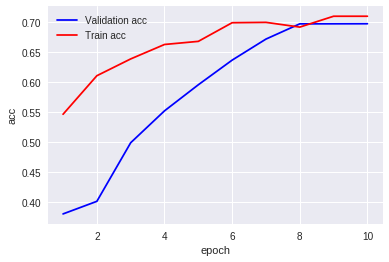

In [15]:
nb_epoch=10
fig,ax = plt.subplots(1,1)
ax.set_xlabel('epoch') ; ax.set_ylabel('acc')
x = list(range(1,nb_epoch+1))
vy =train_acc
ty =test_acc
plt_dynamic(x, vy, ty, ax)

In [0]:
test_images=LoadImages(["validation/"+val for val in os.listdir("validation")])

In [0]:
test_images=LoadImages(X_valid[0:40])

In [0]:
#test_image=resize(imread(X_valid[0]), (512, 512, 3))
predicted=model.predict(test_images)



In [0]:
def plot_comparision(image_id):
  fig, ax = plt.subplots(1, 3, figsize=(15, 10))

  ax[0].imshow(imread(X_valid[image_id].replace('ela95','images')))

  ax[0].set_title('IMAGE')

  ax[1].imshow(predicted[image_id])
  ax[1].set_title('Predicted');
  
  ax[2].imshow(imread(y_valid[image_id]))
  ax[2].set_title('Ground Truth');

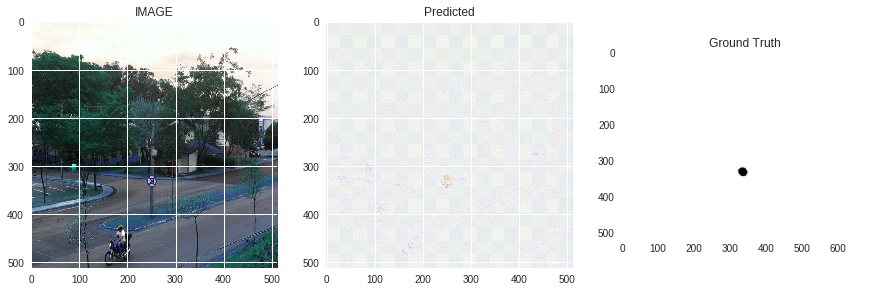

In [0]:
plot_comparision(6)

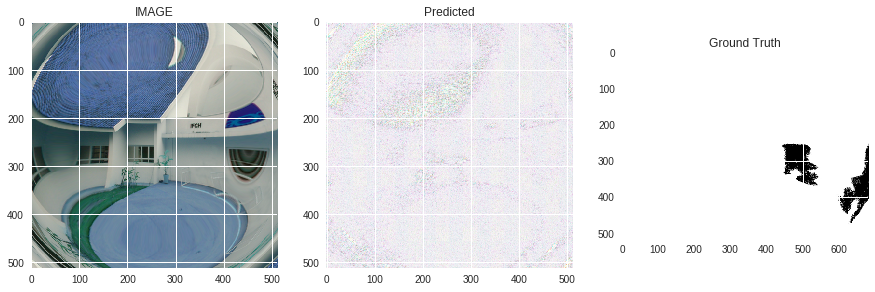

In [0]:
plot_comparision(0)

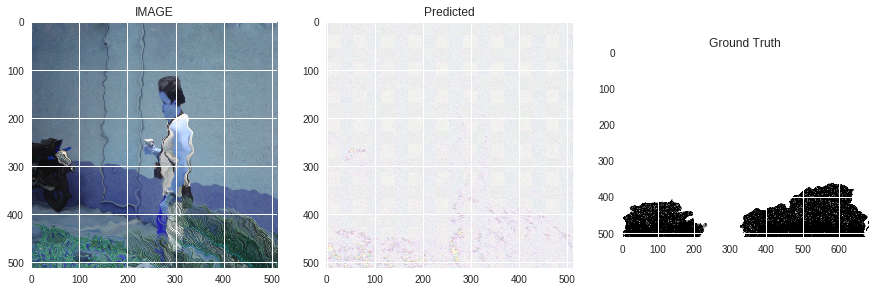

In [0]:
plot_comparision(5)

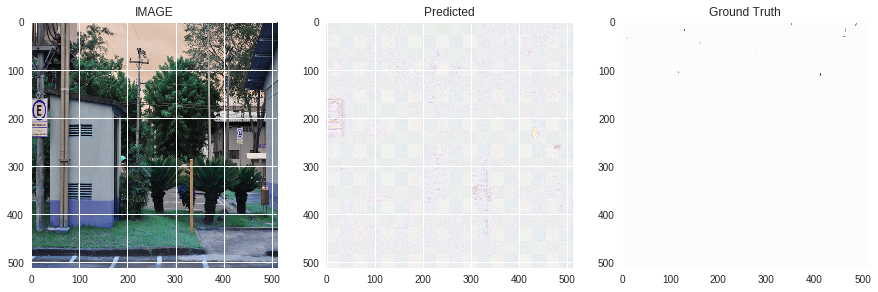

In [0]:
plot_comparision(27)

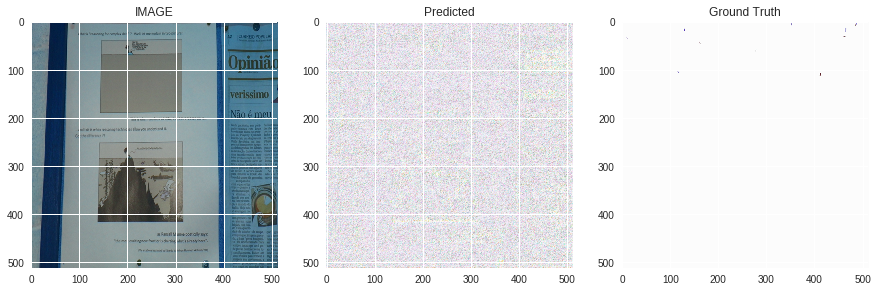

In [0]:
plot_comparision(24)

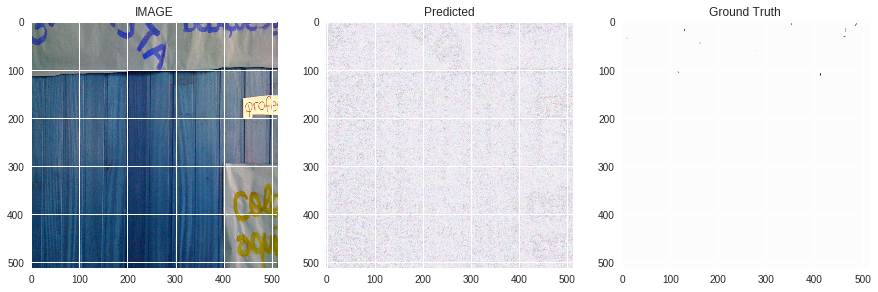

In [0]:
plot_comparision(38)

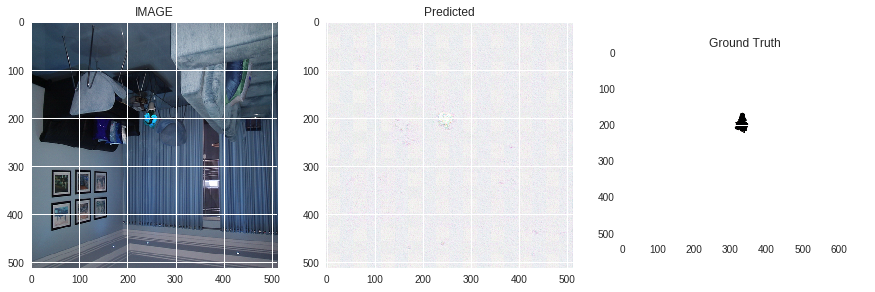

In [0]:
plot_comparision(16)

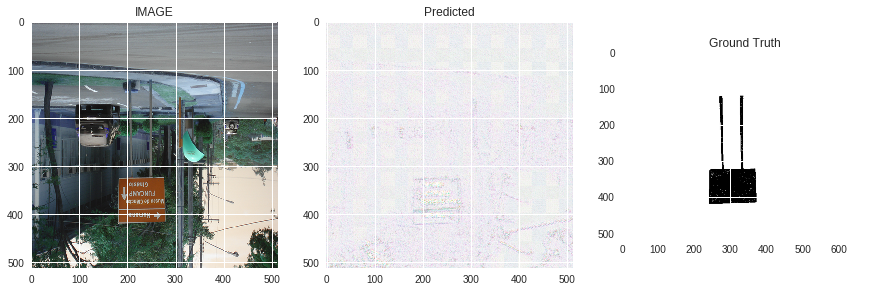

In [0]:
plot_comparision(17)

<h3>Compleatly Failed Cases</h3>

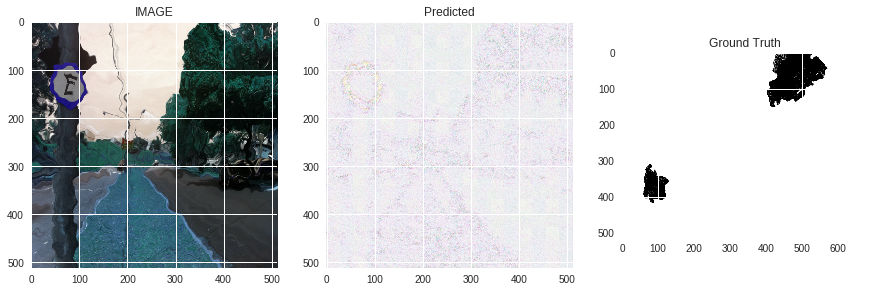

In [0]:
plot_comparision(32)

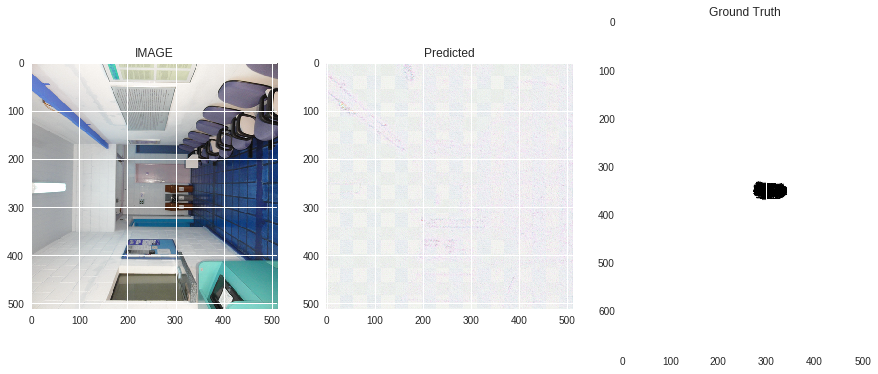

In [0]:
plot_comparision(13)

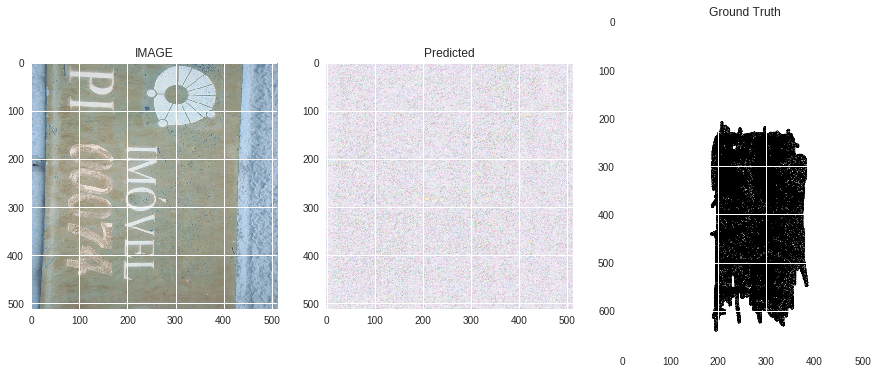

In [0]:
plot_comparision(18)

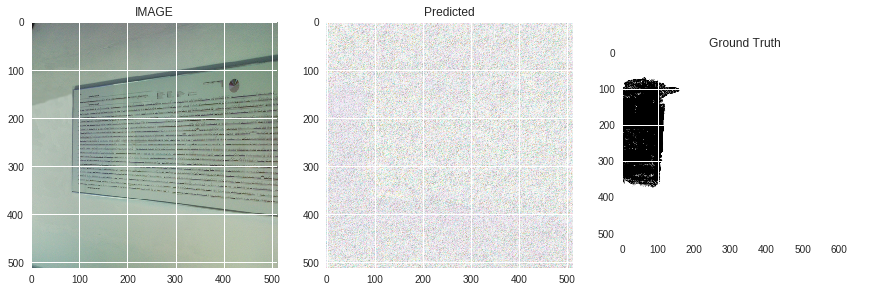

In [0]:
plot_comparision(31)

In [0]:
test="./drive/My Drive/testdata"
test_ela_image_files=[]
test_mask_files=[]
test_image_files=[]
for i in range(12):
  imgpath=test+"/image{}.png".format(i+1)
  ela_image_path=test+"/ela{}.png".format(i+1)
  mask_path=test+"/mask{}.png".format(i+1)
  test_image_files.append(imgpath)
  test_ela_image_files.append(ela_image_path)
  test_mask_files.append(mask_path)
  
  

In [0]:
from PIL import Image, ImageChops
TEMP = 'temp.jpg'
SCALE = 10
def ELA(ORIG):
    image_id=ORIG.replace('./drive/My Drive/testdata','test_ela_images')
    original = Image.open(ORIG).convert("RGB")
    original.save(TEMP, quality=90)
    temporary = Image.open(TEMP)

    diff = ImageChops.difference(original, temporary)
    d = diff.load()
    WIDTH, HEIGHT = diff.size
    for x in range(WIDTH):
        for y in range(HEIGHT):
            d[x, y] = tuple(k * SCALE for k in d[x, y])

    diff.save(image_id)
    print(image_id)



In [0]:
os.makedirs('test_ela_images1')

In [0]:
for file in test_image_files:
  ela(file)

In [0]:
test_image_files[0].replace('./drive/My Drive/testdata','test_imgs')

'test_imgs/image1.png'

In [0]:
test_images=LoadImages(test_ela_image_files)

In [0]:
predicted_test=model.predict(test_images)

<h3>on test data i have analyzed RBG channels and few has done decently good</h3>

In [0]:
def RBG_comparision(image_id):
  fig, ax = plt.subplots(1, 5, figsize=(20, 25))

  ax[0].imshow(imread(test_image_files[image_id].replace('ela95','images')))

  ax[0].set_title('IMAGE')

  #ax[1].imshow(imread(X_valid[image_id]))
  #ax[1].set_title('ELA');

  ax[1].imshow(predicte_test[image_id][:,:,0])
  ax[1].set_title('Predicted channel 1');
  
  ax[2].imshow(predicte_test[image_id][:,:,1])
  ax[2].set_title('Predicted channel 2');
  
  ax[3].imshow(predicte_test[image_id][:,:,2])
  ax[3].set_title('Predicted channel 3');
  
  ax[4].imshow(imread(test_mask_files[image_id]))
  ax[4].set_title('Ground Truth');
  


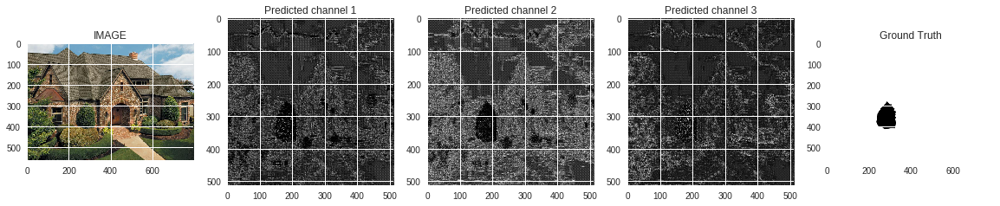

In [0]:
RBG_comparision(0)

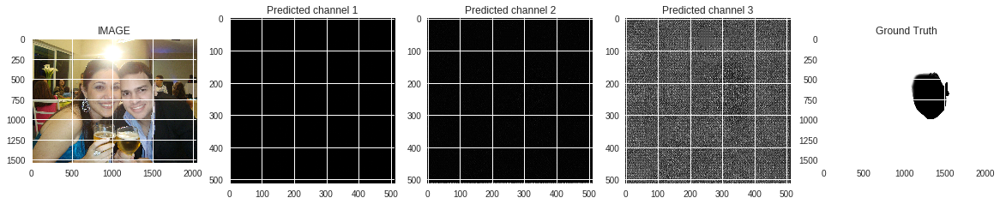

In [0]:
RBG_comparision(2)

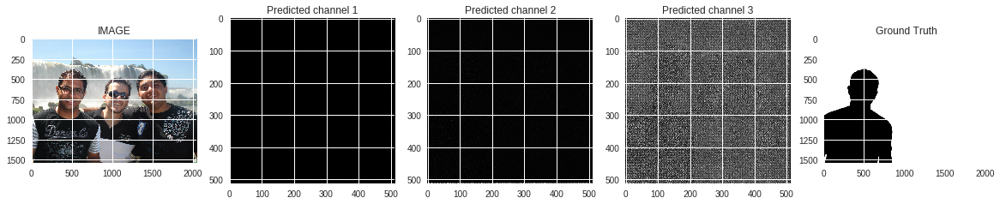

In [0]:
RBG_comparision(3)

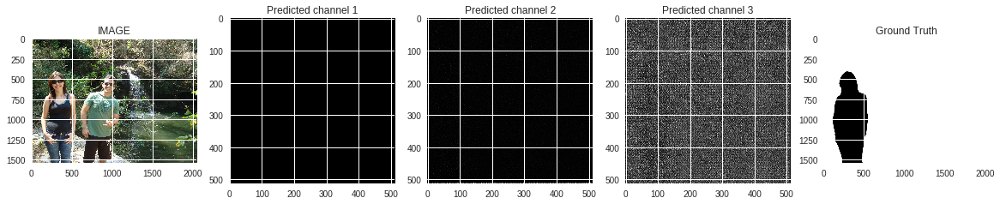

In [0]:
RBG_comparision(4)

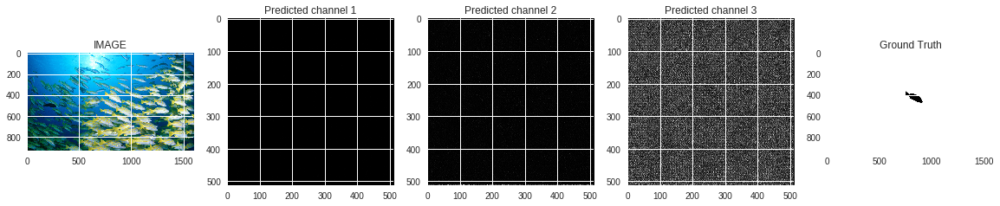

In [0]:
RBG_comparision(5)

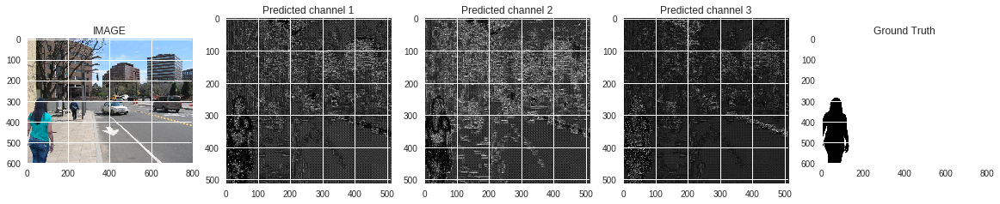

In [0]:
RBG_comparision(6)

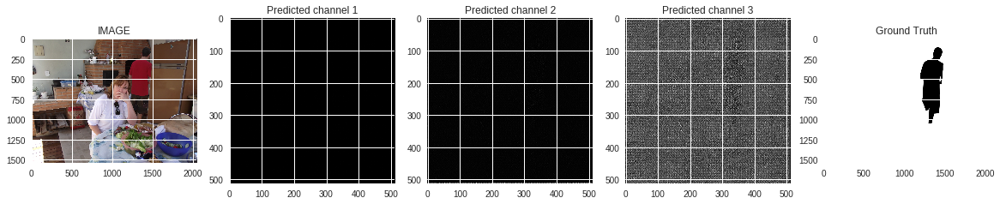

In [0]:
RBG_comparision(7)

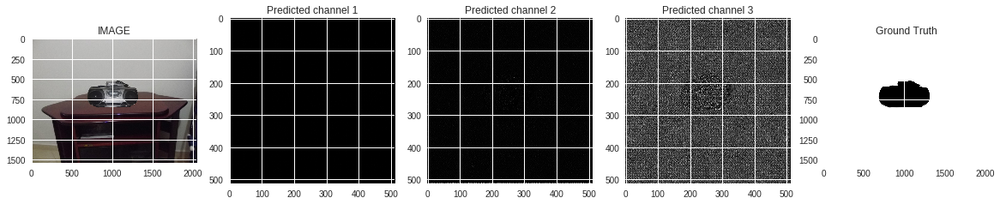

In [0]:
RBG_comparision(8)

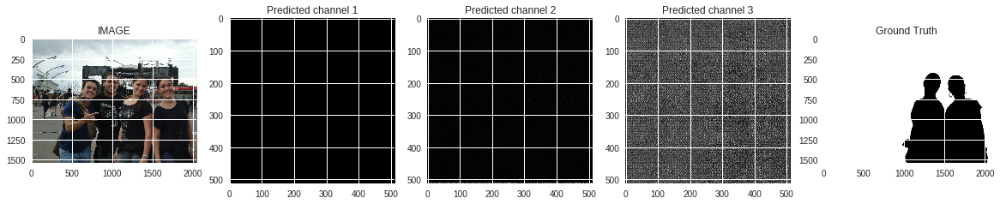

In [0]:
RBG_comparision(9)

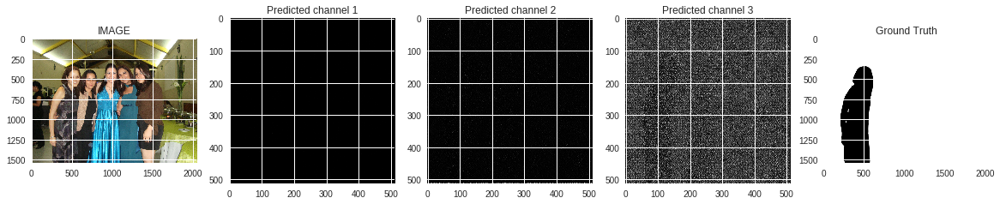

In [0]:
RBG_comparision(10)

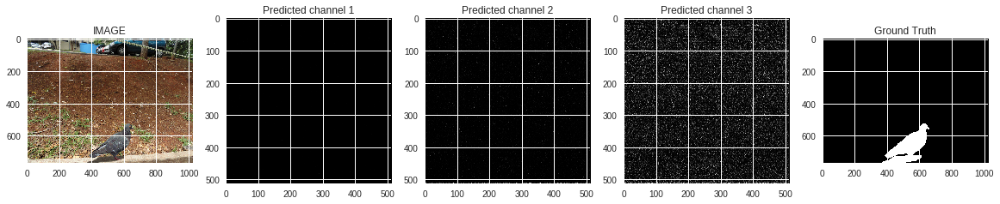

In [0]:
RBG_comparision(11)

<h1>Report</h1>

Image manipulation detection is different from tradi-
tional semantic object detection because it pays more at-
tention to tampering artifacts than to image content, which
suggests that richer features need to be learned.

450 Edited Images and 1050 clean images in different sizes are given as raw data


the data is way small so complex models cannot learn correlation between the pixels so we perform various Image Augmentation, but we have to perfom same image augmentation for image and mask 

After  trying various noice stastics i found out that ela is doing something because when an image is manipulated it leaves some traces of noice, with ela ditecting the noice UNET is segmenting that noice data

ELA: An error level analysis method  which aims to
find the compression error difference between tampered regions
and authentic regions through different JPEG compression
qualities


On top of ELA i used an UNET to compare between each pixel

ELA+UNET Has done partially good in some cases but failed miserably in some cases, there is a lot of room to improve the model like apllying convolution on ELA SRM filter, Actual image and summing them up and also including metadeta by feature extraction in the deepest layers

